In [1]:
%run "la_00.ipynb"

In [2]:
def get_native_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]]

def get_native_aa(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativeaa[pseudoposition][gene_index[gene]]

def get_PDB_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]] + gene_coefficients[gene]

def PDB_to_pseudo_position(gene, pdbposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return nativepos_to_pseudopos[pdbposition][gene_index[gene]] - gene_coefficients[gene]

gene_structures = dict(zip(['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP'], 
                      ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']))

In [3]:
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,9890.458378,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,244.496125,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,2482.724391,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,9488.274423,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,6390.797011,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,25428.434250,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,15983.172132,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,17816.379818,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,17325.780293,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [4]:
#Work in the log scale

by_nt_upd['replicates_mean_brightness'] = by_nt_upd['replicates_mean_brightness'].apply(np.log10)
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,3.995216,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,2.388272,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,3.394929,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,3.977187,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,3.805555,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,4.405320,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,4.203663,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,4.250819,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,4.238693,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [5]:
#Take the gene names of the dataset

genes = sorted(set(by_nt_upd.gene))

genes

['amacGFP', 'cgreGFP', 'ppluGFP']

In [6]:
#Calculate the brightness of the wildtype genes

wt_brightness = {}
for gene in genes:
    wt = by_nt_upd[(by_nt_upd['gene']== gene) & (by_nt_upd['nt_genotype']=='wt')]
    wt_brightness[gene] = wt['replicates_mean_brightness'].median()
    
wt_brightness

{'amacGFP': 3.9759417642196695,
 'cgreGFP': 4.494366479589088,
 'ppluGFP': 4.2269429241006415}

In [7]:
#Create a new dataset which will be sorted by gene, amino acid genotype and nucleotide genotype

aa_mut = by_nt_upd.groupby(['gene','aa_genotype_pseudo', 'aa_genotype_native','nt_genotype']).agg({'total_cell_count': np.sum, 
                         'n_replicates': np.sum, 
                         'replicates_stdev_weighted': np.median, 'replicates_mean_brightness': np.mean,
                        'ddG_monomer': np.median, 'ddG_monomer_stdev': np.median,
                        'ddG_dimer': np.median, 'ddG_dimer_stdev': np.median})
aa_mut.reset_index(inplace=True)

aa_mut

,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,550.913282,3.966691,NaN,NaN,NaN,NaN
1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,1128.986810,3.989159,NaN,NaN,NaN,NaN
2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,604.034225,3.956547,NaN,NaN,NaN,NaN
3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,1307.046595,3.924950,NaN,NaN,NaN,NaN
4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,1808.375972,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
126561,ppluGFP,wt,wt,T659A,2550.52,100.0,2179.232814,4.229176,NaN,NaN,NaN,NaN
126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,1087.798528,4.241842,NaN,NaN,NaN,NaN
126563,ppluGFP,wt,wt,T659C,3953.45,174.0,2149.481279,4.227871,NaN,NaN,NaN,NaN
126564,ppluGFP,wt,wt,T659G,1991.66,49.0,1502.910328,4.225663,NaN,NaN,NaN,NaN


In [8]:
#Select the gene ppluGFP

aa_mut_ppluGFP = aa_mut[aa_mut.gene=='ppluGFP']
aa_mut_ppluGFP.reset_index(inplace=True)

aa_mut_ppluGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,79405,ppluGFP,*246C,*222C,A668T,80.12,5.0,2187.444683,4.219183,NaN,NaN,NaN,NaN
1,79406,ppluGFP,*246C,*222C,C443T:A668T,175.57,8.0,1021.190341,4.221520,NaN,NaN,NaN,NaN
2,79407,ppluGFP,*246D,*222D,A665T:T666G:G667A:A668T,248.77,12.0,2906.194501,4.269007,NaN,NaN,NaN,NaN
3,79408,ppluGFP,*246G,*222G,A131T:C278T:T666G,46.58,6.0,3168.085504,4.241350,NaN,NaN,NaN,NaN
4,79409,ppluGFP,*246G,*222G,C188T:T666G,84.80,4.0,995.413000,4.247161,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47156,126561,ppluGFP,wt,wt,T659A,2550.52,100.0,2179.232814,4.229176,NaN,NaN,NaN,NaN
47157,126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,1087.798528,4.241842,NaN,NaN,NaN,NaN
47158,126563,ppluGFP,wt,wt,T659C,3953.45,174.0,2149.481279,4.227871,NaN,NaN,NaN,NaN
47159,126564,ppluGFP,wt,wt,T659G,1991.66,49.0,1502.910328,4.225663,NaN,NaN,NaN,NaN


In [9]:
#Calculate the median of the gene brightness
mean_bright_ppluGFP = aa_mut_ppluGFP['replicates_mean_brightness'].median()
mean_bright_ppluGFP

4.163647933644794

In [10]:
#Make a copy of the dataset with which we will work for the benficial mutations

#aa_mut_ppluGFP['replicates_mean_brightness'] = aa_mut_ppluGFP['replicates_mean_brightness']/9.587153664485962

ben_mut_ppluGFP=aa_mut_ppluGFP.copy()
ben_mut_ppluGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,79405,ppluGFP,*246C,*222C,A668T,80.12,5.0,2187.444683,4.219183,NaN,NaN,NaN,NaN
1,79406,ppluGFP,*246C,*222C,C443T:A668T,175.57,8.0,1021.190341,4.221520,NaN,NaN,NaN,NaN
2,79407,ppluGFP,*246D,*222D,A665T:T666G:G667A:A668T,248.77,12.0,2906.194501,4.269007,NaN,NaN,NaN,NaN
3,79408,ppluGFP,*246G,*222G,A131T:C278T:T666G,46.58,6.0,3168.085504,4.241350,NaN,NaN,NaN,NaN
4,79409,ppluGFP,*246G,*222G,C188T:T666G,84.80,4.0,995.413000,4.247161,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47156,126561,ppluGFP,wt,wt,T659A,2550.52,100.0,2179.232814,4.229176,NaN,NaN,NaN,NaN
47157,126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,1087.798528,4.241842,NaN,NaN,NaN,NaN
47158,126563,ppluGFP,wt,wt,T659C,3953.45,174.0,2149.481279,4.227871,NaN,NaN,NaN,NaN
47159,126564,ppluGFP,wt,wt,T659G,1991.66,49.0,1502.910328,4.225663,NaN,NaN,NaN,NaN


In [11]:
#Calculate the number of amino acid mutations

sum_mut = lambda s: (len(s)>0)*(len(s.split(':'))) if s!='wt' else 0
ben_mut_ppluGFP['aa_mutnumber'] = ben_mut_ppluGFP['aa_genotype_pseudo'].apply(sum_mut)
ben_mut_ppluGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,79405,ppluGFP,*246C,*222C,A668T,80.12,5.0,2187.444683,4.219183,NaN,NaN,NaN,NaN,1
1,79406,ppluGFP,*246C,*222C,C443T:A668T,175.57,8.0,1021.190341,4.221520,NaN,NaN,NaN,NaN,1
2,79407,ppluGFP,*246D,*222D,A665T:T666G:G667A:A668T,248.77,12.0,2906.194501,4.269007,NaN,NaN,NaN,NaN,1
3,79408,ppluGFP,*246G,*222G,A131T:C278T:T666G,46.58,6.0,3168.085504,4.241350,NaN,NaN,NaN,NaN,1
4,79409,ppluGFP,*246G,*222G,C188T:T666G,84.80,4.0,995.413000,4.247161,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47156,126561,ppluGFP,wt,wt,T659A,2550.52,100.0,2179.232814,4.229176,NaN,NaN,NaN,NaN,0
47157,126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,1087.798528,4.241842,NaN,NaN,NaN,NaN,0
47158,126563,ppluGFP,wt,wt,T659C,3953.45,174.0,2149.481279,4.227871,NaN,NaN,NaN,NaN,0
47159,126564,ppluGFP,wt,wt,T659G,1991.66,49.0,1502.910328,4.225663,NaN,NaN,NaN,NaN,0


In [12]:
#Take the mutants that have a maximum number of amino acid mutations of 10 and check it

ben_mut_ppluGFP = ben_mut_ppluGFP[ben_mut_ppluGFP['aa_mutnumber'] <= 10]
ben_mut_ppluGFP.aa_mutnumber.max()

10

In [13]:
#Take the wt genes out of the dataframe

ben_mut_ppluGFP = ben_mut_ppluGFP.loc[ben_mut_ppluGFP['aa_genotype_pseudo'] != 'wt']
ben_mut_ppluGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,79405,ppluGFP,*246C,*222C,A668T,80.12,5.0,2187.444683,4.219183,NaN,NaN,NaN,NaN,1
1,79406,ppluGFP,*246C,*222C,C443T:A668T,175.57,8.0,1021.190341,4.221520,NaN,NaN,NaN,NaN,1
2,79407,ppluGFP,*246D,*222D,A665T:T666G:G667A:A668T,248.77,12.0,2906.194501,4.269007,NaN,NaN,NaN,NaN,1
3,79408,ppluGFP,*246G,*222G,A131T:C278T:T666G,46.58,6.0,3168.085504,4.241350,NaN,NaN,NaN,NaN,1
4,79409,ppluGFP,*246G,*222G,C188T:T666G,84.80,4.0,995.413000,4.247161,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44391,123796,ppluGFP,Y95S:F113L:A193T:R210H,Y82S:F100L:A178T:R195H,C47T:A247C:T300C:T398A:G534A:G586A,113.51,9.0,602.062789,3.181077,NaN,NaN,NaN,NaN,4
44392,123797,ppluGFP,Y95S:N222Y,Y82S:N202Y,C74T:T246A:A247G:A515T:A606T,96.47,7.0,1547.845384,4.081156,NaN,NaN,NaN,NaN,2
44393,123798,ppluGFP,Y95S:R99C:F113S,Y82S:R86C:F100S,A247C:C258T:T301C,65.83,3.0,278.175491,2.483638,NaN,NaN,NaN,NaN,3
44394,123799,ppluGFP,Y95S:S192G,Y82S:S177G,A247C:A531G:T575C,55.05,6.0,1694.179067,4.110760,NaN,NaN,NaN,NaN,2


In [14]:
#Select the single mutants

position_ben_sing_ppluGFP = {}               

for index, row in ben_mut_ppluGFP.iterrows(): 
        if ':' not in row["aa_genotype_pseudo"]:
            position_ben_sing_ppluGFP[index] = row["aa_genotype_pseudo"]
            
position_ben_sing_ppluGFP = pd.DataFrame.from_dict(position_ben_sing_ppluGFP, orient='index')

position_ben_sing_ppluGFP.columns=['aa_mutation']
position_ben_sing_ppluGFP

,aa_mutation
0,*246C
1,*246C
2,*246D
3,*246G
4,*246G
...,...
44384,Y95S
44385,Y95S
44386,Y95S
44387,Y95S


In [15]:
#Select the multiple mutants and take out all the mutations that appear in them

position_ben_mult_ppluGFP={}

for index, row in ben_mut_ppluGFP.iterrows(): 
        if ':' in row["aa_genotype_pseudo"]:
            position_ben_mult_ppluGFP[index] = (row["aa_genotype_pseudo"].split(":"))
            
position_ben_mult_ppluGFP = pd.DataFrame.from_dict(position_ben_mult_ppluGFP, orient='index')
position_ben_mult_ppluGFP=position_ben_mult_ppluGFP.stack()
position_ben_mult_ppluGFP=pd.DataFrame(position_ben_mult_ppluGFP)
position_ben_mult_ppluGFP.columns=['aa_mutation']
position_ben_mult_ppluGFP = position_ben_mult_ppluGFP.reset_index()
position_ben_mult_ppluGFP=position_ben_mult_ppluGFP.drop(['level_0', 'level_1'], axis=1)

position_ben_mult_ppluGFP

,aa_mutation
0,A119E
1,E213V
2,K235R
3,A119E
4,F172Y
...,...
86872,F113S
86873,Y95S
86874,S192G
86875,Y95S


In [16]:
#Concatenate the dataframes with all the present mutations, select the unique ones and convert the dataframe to a list

ben_frames = [position_ben_mult_ppluGFP, position_ben_mult_ppluGFP]
position_ben_ppluGFP = pd.concat(ben_frames)

mut_unique_pplu = position_ben_ppluGFP.aa_mutation.unique()
mut_unique_pplu = np.ndarray.tolist(mut_unique_pplu)

mut_unique_pplu

['A119E',
 'E213V',
 'K235R',
 'F172Y',
 'I238T',
 'F182L',
 'G226E',
 'G226W',
 'H154N',
 'H154Y',
 'G202C',
 'H156Y',
 'M158T',
 'H232R',
 'L199Q',
 'N162D',
 'G178S',
 'N162K',
 'N162Y',
 'F240S',
 'P196T',
 'T131S',
 'L214H',
 'F234S',
 'V122A',
 'V128L',
 'I145F',
 'Q200K',
 'A119G',
 'D176G',
 'V228A',
 'K127M',
 'R175H',
 'K143R',
 'F208V',
 'R147C',
 'Y179N',
 'S197C',
 'A119P',
 'F168L',
 'H156L',
 'T131A',
 'G132C',
 'A119S',
 'A150V',
 'G203C',
 'I123V',
 'I194T',
 'A233T',
 'I238V',
 'M188T',
 'I198F',
 'R210H',
 'E229V',
 'T151A',
 'N162S',
 'A239D',
 'V129A',
 'A119T',
 'A150S',
 'N222Y',
 'A233P',
 'E135D',
 'S181T',
 'L199M',
 'P204L',
 'F168S',
 'G120C',
 'G160C',
 'Q200R',
 'H154Q',
 'K235E',
 'F240Y',
 'I145L',
 'I145T',
 'G203R',
 'K127E',
 'K143M',
 'K127N',
 'K191R',
 'F208S',
 'L174M',
 'E224D',
 'M158I',
 'M158K',
 'G203S',
 'Q200L',
 'Q231L',
 'R121C',
 'R170S',
 'R175S',
 'R210C',
 'S197N',
 'S197T',
 'S221C',
 'V228D',
 'S221G',
 'T141A',
 'T223A',
 'I227T',


In [17]:
print(type(mut_unique_pplu))

<class 'list'>


In [18]:
#Take the backgrounds of each mutation in the previous list. That is, take all the mutants that contain the mutation

all_mut_bac={}

for mutation in mut_unique_pplu:
    mut_bac= ben_mut_ppluGFP[ben_mut_ppluGFP['aa_genotype_pseudo'].apply(lambda multi: mutation in multi.split(':'))]
    background = mut_bac['aa_genotype_pseudo'].apply(lambda nom: ':'.join([m for m in nom.split(':') if m != mutation]))
    mut_bac['mut_background']=background
    mut_bac['mutation'] = mutation
    mut_bac['bright_mutation'] = ben_mut_ppluGFP[ben_mut_ppluGFP['aa_genotype_pseudo']==mutation]['replicates_mean_brightness'].median()
    all_mut_bac[mutation]=mut_bac
    
all_mut_bac

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

{'A119E':         index     gene                aa_genotype_pseudo  \
 16      79421  ppluGFP                             A119E   
 17      79422  ppluGFP                             A119E   
 18      79423  ppluGFP                             A119E   
 19      79424  ppluGFP                             A119E   
 20      79425  ppluGFP                             A119E   
 ...       ...      ...                               ...   
 37003  116408  ppluGFP            T51A:A119E:R121C:T171A   
 40344  119749  ppluGFP  V27A:G42D:N91T:A119E:I144V:A233T   
 41687  121092  ppluGFP     Y103H:G107D:A119E:G124R:T223S   
 43272  122677  ppluGFP              Y71N:E81V:I90N:A119E   
 43719  123124  ppluGFP                  Y80F:A119E:K191R   
 
                      aa_genotype_native                          nt_genotype  \
 16                                A106E                            A5T:C319A   
 17                                A106E                                C319A   
 18           

In [19]:
#Convert the dictionary to a dataframe

dict_of_df = {k:pd.DataFrame(v) for k,v in all_mut_bac.items()}
df_bis=pd.concat(dict_of_df,axis=0)

In [20]:
#Drop the columns that we do not need

df_bis =df_bis.drop(columns=['nt_genotype', 'total_cell_count','n_replicates','ddG_monomer',
                            'ddG_monomer_stdev','ddG_dimer','ddG_dimer_stdev'])
df_bis

index     gene          aa_genotype_pseudo  \
A119E 16      79421  ppluGFP                       A119E   
      17      79422  ppluGFP                       A119E   
      18      79423  ppluGFP                       A119E   
      19      79424  ppluGFP                       A119E   
      20      79425  ppluGFP                       A119E   
...             ...      ...                         ...   
N92R  43386  122791  ppluGFP  Y76C:Y80C:N92R:N222D:I238N   
Y76I  43533  122938  ppluGFP                  Y76I:V138I   
T151P 43814  123219  ppluGFP            Y80F:T151P:I194N   
V128E 43999  123404  ppluGFP      Y95*:V108I:V128E:L199Q   
R175N 44317  123722  ppluGFP                  Y95H:R175N   

                     aa_genotype_native  replicates_stdev_weighted  \
A119E 16                          A106E                1194.503603   
      17                          A106E                2142.644682   
      18                          A106E                1514.406569   
      19                          A106E                1760.998952   
      20                          A106E                2017.580726   
...                                 ...                        ...   
N92R  43386  Y65C:Y69C:N79R:N202D:I218N                1611.893847   
Y76I  43533                  Y65I:V125I                1199.373323   
T151P 43814            Y69F:T137P:I179N                3146.699522   
V128E 43999       Y82*:V95I:V115E:L184Q                2126.468087   
R175N 44317                  Y82H:R160N                1101.765756   

             replicates_mean_brightness  aa_mutnumber         mut_background  \
A119E 16                       4.260879             1                          
      17                       4.249360             1                          
      18                       4.232426             1                          
      19                       4.227483             1                          
      20                       4.313382             1                          
...                                 ...           ...                    ...   
N92R  43386                    4.137031             5  Y76C:Y80C:N222D:I238N   
Y76I  43533                    4.133122             2                  V138I   
T151P 43814                    3.996348             3             Y80F:I194N   
V128E 43999                    4.088956             4       Y95*:V108I:L199Q   
R175N 44317                    4.205877             2                   Y95H   

            mutation  bright_mutation  
A119E 16       A119E         4.236976  
      17       A119E         4.236976  
      18       A119E         4.236976  
      19       A119E         4.236976  
      20       A119E         4.236976  
...              ...              ...  
N92R  43386     N92R              NaN  
Y76I  43533     Y76I              NaN  
T151P 43814    T151P              NaN  
V128E 43999    V128E              NaN  
R175N 44317    R175N              NaN  

[99470 rows x 10 columns]

In [21]:
print(type(df_bis))

<class 'pandas.core.frame.DataFrame'>


In [22]:
#Take out the mutants that do not have background

filter = df_bis["mut_background"] != ""
dfNew = df_bis[filter]
dfNew

index     gene          aa_genotype_pseudo  \
A119E 23      79428  ppluGFP           A119E:E213V:K235R   
      24      79429  ppluGFP           A119E:F172Y:I238T   
      25      79430  ppluGFP                 A119E:F182L   
      26      79431  ppluGFP                 A119E:G226E   
      27      79432  ppluGFP                 A119E:G226W   
...             ...      ...                         ...   
N92R  43386  122791  ppluGFP  Y76C:Y80C:N92R:N222D:I238N   
Y76I  43533  122938  ppluGFP                  Y76I:V138I   
T151P 43814  123219  ppluGFP            Y80F:T151P:I194N   
V128E 43999  123404  ppluGFP      Y95*:V108I:V128E:L199Q   
R175N 44317  123722  ppluGFP                  Y95H:R175N   

                     aa_genotype_native  replicates_stdev_weighted  \
A119E 23              A106E:E198V:K215R                 701.225763   
      24              A106E:F157Y:I218T                1857.732806   
      25                    A106E:F167L                2599.467091   
      26                    A106E:G206E                 850.564908   
      27                    A106E:G206W                3498.095410   
...                                 ...                        ...   
N92R  43386  Y65C:Y69C:N79R:N202D:I218N                1611.893847   
Y76I  43533                  Y65I:V125I                1199.373323   
T151P 43814            Y69F:T137P:I179N                3146.699522   
V128E 43999       Y82*:V95I:V115E:L184Q                2126.468087   
R175N 44317                  Y82H:R160N                1101.765756   

             replicates_mean_brightness  aa_mutnumber         mut_background  \
A119E 23                       3.701343             3            E213V:K235R   
      24                       4.171561             3            F172Y:I238T   
      25                       4.203795             2                  F182L   
      26                       4.406549             2                  G226E   
      27                       4.337812             2                  G226W   
...                                 ...           ...                    ...   
N92R  43386                    4.137031             5  Y76C:Y80C:N222D:I238N   
Y76I  43533                    4.133122             2                  V138I   
T151P 43814                    3.996348             3             Y80F:I194N   
V128E 43999                    4.088956             4       Y95*:V108I:L199Q   
R175N 44317                    4.205877             2                   Y95H   

            mutation  bright_mutation  
A119E 23       A119E         4.236976  
      24       A119E         4.236976  
      25       A119E         4.236976  
      26       A119E         4.236976  
      27       A119E         4.236976  
...              ...              ...  
N92R  43386     N92R              NaN  
Y76I  43533     Y76I              NaN  
T151P 43814    T151P              NaN  
V128E 43999    V128E              NaN  
R175N 44317    R175N              NaN  

[86877 rows x 10 columns]

In [23]:
#Drop columns we do not want

dfNew =dfNew.drop(columns=['index'])
dfNew=dfNew.reset_index(level=0, drop=True)
dfNew=dfNew.reset_index(drop=True)
dfNew =dfNew.dropna()
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation
0,ppluGFP,A119E:E213V:K235R,A106E:E198V:K215R,701.225763,3.701343,3,E213V:K235R,A119E,4.236976
1,ppluGFP,A119E:F172Y:I238T,A106E:F157Y:I218T,1857.732806,4.171561,3,F172Y:I238T,A119E,4.236976
2,ppluGFP,A119E:F182L,A106E:F167L,2599.467091,4.203795,2,F182L,A119E,4.236976
3,ppluGFP,A119E:G226E,A106E:G206E,850.564908,4.406549,2,G226E,A119E,4.236976
4,ppluGFP,A119E:G226W,A106E:G206W,3498.095410,4.337812,2,G226W,A119E,4.236976
...,...,...,...,...,...,...,...,...,...
86839,ppluGFP,V108A:E229W,V95A:E209W,263.003548,2.660601,2,V108A,E229W,2.469598
86842,ppluGFP,V108T:I145V:G160C:K235E,V95T:I132V:G145C:K215E,2545.495751,4.300713,4,I145V:G160C:K235E,V108T,4.220718
86854,ppluGFP,Y103N:H232L,Y90N:H212L,432.796736,2.587211,2,H232L,Y103N,4.054178
86856,ppluGFP,Y117D:N149S:R170L:G226E,Y104D:N135S:R155L:G206E,2372.094932,3.826746,4,N149S:R170L:G226E,Y117D,4.090839


In [24]:
#Select only the backgrounds

background=dfNew.mut_background
background

0              E213V:K235R
1              F172Y:I238T
2                    F182L
3                    G226E
4                    G226W
               ...        
86839                V108A
86842    I145V:G160C:K235E
86854                H232L
86856    N149S:R170L:G226E
86857    V165L:R175C:F182L
Name: mut_background, Length: 85424, dtype: object

In [25]:
#Take the brightness for each background

mut_bac = {}
for bac in background:
    bright = ben_mut_ppluGFP[ben_mut_ppluGFP['aa_genotype_pseudo']== bac]
    mut_bac[bac] = bright['replicates_mean_brightness'].median()
    
mut_bac = pd.DataFrame.from_dict(mut_bac, orient='index')
mut_bac.columns =['bright_background']
mut_bac = mut_bac.rename_axis('mut_background').reset_index()

mut_bac

,mut_background,bright_background
0,E213V:K235R,NaN
1,F172Y:I238T,NaN
2,F182L,4.188370
3,G226E,4.395856
4,G226W,4.248462
...,...,...
51353,A54E:E229V,NaN
51354,F73L:D136G:F182S,NaN
51355,I145V:G160C:K235E,NaN
51356,N149S:R170L:G226E,NaN


In [26]:
#Merge the dataframe with the backgrounds and the correspondant brightness and the initial dataframe

dfNew_bis= pd.merge(dfNew, mut_bac, on='mut_background')
dfNew_bis

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,ppluGFP,A119E:E213V:K235R,A106E:E198V:K215R,701.225763,3.701343,3,E213V:K235R,A119E,4.236976,NaN
1,ppluGFP,A119E:F172Y:I238T,A106E:F157Y:I218T,1857.732806,4.171561,3,F172Y:I238T,A119E,4.236976,NaN
2,ppluGFP,F172Y:E224V:I238T,F157Y:E204V:I218T,2483.827773,4.242014,3,F172Y:I238T,E224V,4.301914,NaN
3,ppluGFP,A119E:F182L,A106E:F167L,2599.467091,4.203795,2,F182L,A119E,4.236976,4.18837
4,ppluGFP,F182L:I238T,F167L:I218T,973.879524,4.237181,2,F182L,I238T,4.235277,4.18837
...,...,...,...,...,...,...,...,...,...,...
85419,ppluGFP,T51P:A54E:E229V,T40P:A43E:E209V,327.770717,2.561986,3,A54E:E229V,T51P,4.162314,NaN
85420,ppluGFP,T51P:F73L:D136G:F182S,T40P:F62L:D123G:F167S,638.616940,3.571322,4,F73L:D136G:F182S,T51P,4.162314,NaN
85421,ppluGFP,V108T:I145V:G160C:K235E,V95T:I132V:G145C:K215E,2545.495751,4.300713,4,I145V:G160C:K235E,V108T,4.220718,NaN
85422,ppluGFP,Y117D:N149S:R170L:G226E,Y104D:N135S:R155L:G206E,2372.094932,3.826746,4,N149S:R170L:G226E,Y117D,4.090839,NaN


In [27]:
#Eliminate NaN rows

dfNew =dfNew_bis.dropna()
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
3,ppluGFP,A119E:F182L,A106E:F167L,2599.467091,4.203795,2,F182L,A119E,4.236976,4.188370
4,ppluGFP,F182L:I238T,F167L:I218T,973.879524,4.237181,2,F182L,I238T,4.235277,4.188370
5,ppluGFP,N162Y:F182L,N147Y:F167L,1504.247443,4.210618,2,F182L,N162Y,4.214402,4.188370
6,ppluGFP,F182L:F234S,F167L:F214S,1837.801006,4.099939,2,F182L,F234S,4.190624,4.188370
7,ppluGFP,V122A:F182L,V109A:F167L,1950.925041,4.110373,2,F182L,V122A,4.179625,4.188370
...,...,...,...,...,...,...,...,...,...,...
85370,ppluGFP,P1S:N97D:S221C,P1S:N84D:S201C,201.664693,3.249340,3,N97D:S221C,P1S,4.201096,3.254457
85382,ppluGFP,P77R:V152A:F182S,P66R:V138A:F167S,294.000085,2.521348,3,V152A:F182S,P77R,4.118211,4.274094
85387,ppluGFP,S63I:D176G:V184A,S52I:D161G:V169A,402.058385,3.418231,3,D176G:V184A,S63I,2.805825,4.224907
85412,ppluGFP,T23N:V152I:F168S,T12N:V138I:F153S,1322.744717,3.722406,3,V152I:F168S,T23N,4.250363,3.784366


In [28]:
dfNew = dfNew.loc[dfNew['bright_background'] >= (0.7*4.2269429241006415)]#0.9882420723421813)]

In [29]:
dfNew['ones'] = 1

dfNew['bac_num']=""

for index, row in dfNew.iterrows():
    pos= row['mutation']
    dfNew['bac_num'][index] = dfNew[dfNew['mutation']==pos].ones.sum()

dfNew = dfNew.sort_values(['bac_num'],ascending=False)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
7780,ppluGFP,V129E:F182L,V116E:F167L,1206.260697,4.159856,2,V129E,F182L,4.188370,4.216258,1,158
11460,ppluGFP,E118D:F182L,E105D:F167L,400.796540,4.112199,2,E118D,F182L,4.188370,4.207003,1,158
3387,ppluGFP,G34V:F182L,G23V:F167L,1741.773235,4.019294,2,G34V,F182L,4.188370,4.181443,1,158
11416,ppluGFP,D161V:F182L,D146V:F167L,1898.286512,4.173380,2,D161V,F182L,4.188370,4.202607,1,158
13559,ppluGFP,F86Y:F182L,F73Y:F167L,438.453966,4.156517,2,F86Y,F182L,4.188370,4.211218,1,158
...,...,...,...,...,...,...,...,...,...,...,...,...
26550,ppluGFP,D176N:G177A,D161N:G162A,2207.028241,4.042173,2,D176N,G177A,4.065105,4.221144,1,1
42736,ppluGFP,S181P:F206S,S166P:F191S,2562.350235,3.868780,2,S181P,F206S,4.234164,4.114511,1,1
8416,ppluGFP,I123S:F206L,I110S:F191L,992.839500,4.134776,2,F206L,I123S,4.172155,4.149446,1,1
7611,ppluGFP,L61V:N162D,L50V:N147D,1847.569047,4.207939,2,N162D,L61V,4.192237,4.208150,1,1


In [30]:
dfNew = dfNew.loc[dfNew['bac_num'] > 5]
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
7780,ppluGFP,V129E:F182L,V116E:F167L,1206.260697,4.159856,2,V129E,F182L,4.188370,4.216258,1,158
11460,ppluGFP,E118D:F182L,E105D:F167L,400.796540,4.112199,2,E118D,F182L,4.188370,4.207003,1,158
3387,ppluGFP,G34V:F182L,G23V:F167L,1741.773235,4.019294,2,G34V,F182L,4.188370,4.181443,1,158
11416,ppluGFP,D161V:F182L,D146V:F167L,1898.286512,4.173380,2,D161V,F182L,4.188370,4.202607,1,158
13559,ppluGFP,F86Y:F182L,F73Y:F167L,438.453966,4.156517,2,F86Y,F182L,4.188370,4.211218,1,158
...,...,...,...,...,...,...,...,...,...,...,...,...
83255,ppluGFP,Y80C:S197G:I238M,Y69C:S182G:I218M,1131.168490,4.217196,3,Y80C:S197G,I238M,4.240589,4.216171,1,6
55303,ppluGFP,H88D:F208C,H75D:F193C,1792.471723,4.115898,2,F208C,H88D,4.204877,4.135153,1,6
13454,ppluGFP,V184G:Y230C,V169G:Y210C,1075.960548,4.144856,2,Y230C,V184G,4.074169,4.293265,1,6
23489,ppluGFP,E224A:A239D,E204A:A219D,2069.345909,4.292515,2,A239D,E224A,4.246958,4.359745,1,6


In [31]:
#Create a new value, the brightness in context of the background, by subtracting the brightness of the background to 
#the brightness of the mutant. The result is the brightness of the mutation in context of that background.

dfNew['bright_context'] = dfNew['replicates_mean_brightness'] - dfNew['bright_background']
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context
7780,ppluGFP,V129E:F182L,V116E:F167L,1206.260697,4.159856,2,V129E,F182L,4.188370,4.216258,1,158,-0.056403
11460,ppluGFP,E118D:F182L,E105D:F167L,400.796540,4.112199,2,E118D,F182L,4.188370,4.207003,1,158,-0.094804
3387,ppluGFP,G34V:F182L,G23V:F167L,1741.773235,4.019294,2,G34V,F182L,4.188370,4.181443,1,158,-0.162149
11416,ppluGFP,D161V:F182L,D146V:F167L,1898.286512,4.173380,2,D161V,F182L,4.188370,4.202607,1,158,-0.029228
13559,ppluGFP,F86Y:F182L,F73Y:F167L,438.453966,4.156517,2,F86Y,F182L,4.188370,4.211218,1,158,-0.054701
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83255,ppluGFP,Y80C:S197G:I238M,Y69C:S182G:I218M,1131.168490,4.217196,3,Y80C:S197G,I238M,4.240589,4.216171,1,6,0.001026
55303,ppluGFP,H88D:F208C,H75D:F193C,1792.471723,4.115898,2,F208C,H88D,4.204877,4.135153,1,6,-0.019255
13454,ppluGFP,V184G:Y230C,V169G:Y210C,1075.960548,4.144856,2,Y230C,V184G,4.074169,4.293265,1,6,-0.148408
23489,ppluGFP,E224A:A239D,E204A:A219D,2069.345909,4.292515,2,A239D,E224A,4.246958,4.359745,1,6,-0.067230


In [32]:
#Create a new column with the position of each mutation

dfNew['position'] = dfNew['mutation'].str[1:-1].apply(int)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position
7780,ppluGFP,V129E:F182L,V116E:F167L,1206.260697,4.159856,2,V129E,F182L,4.188370,4.216258,1,158,-0.056403,182
11460,ppluGFP,E118D:F182L,E105D:F167L,400.796540,4.112199,2,E118D,F182L,4.188370,4.207003,1,158,-0.094804,182
3387,ppluGFP,G34V:F182L,G23V:F167L,1741.773235,4.019294,2,G34V,F182L,4.188370,4.181443,1,158,-0.162149,182
11416,ppluGFP,D161V:F182L,D146V:F167L,1898.286512,4.173380,2,D161V,F182L,4.188370,4.202607,1,158,-0.029228,182
13559,ppluGFP,F86Y:F182L,F73Y:F167L,438.453966,4.156517,2,F86Y,F182L,4.188370,4.211218,1,158,-0.054701,182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83255,ppluGFP,Y80C:S197G:I238M,Y69C:S182G:I218M,1131.168490,4.217196,3,Y80C:S197G,I238M,4.240589,4.216171,1,6,0.001026,238
55303,ppluGFP,H88D:F208C,H75D:F193C,1792.471723,4.115898,2,F208C,H88D,4.204877,4.135153,1,6,-0.019255,88
13454,ppluGFP,V184G:Y230C,V169G:Y210C,1075.960548,4.144856,2,Y230C,V184G,4.074169,4.293265,1,6,-0.148408,184
23489,ppluGFP,E224A:A239D,E204A:A219D,2069.345909,4.292515,2,A239D,E224A,4.246958,4.359745,1,6,-0.067230,224


In [33]:
#For each position create the median value of the brightness in context of all mutations

dfNew_try = dfNew.copy()
dfNew_try['median']=""

for index, row in dfNew_try.iterrows():
    pos = row['mutation']
    dfNew_try['median'][index] = dfNew_try[dfNew_try['mutation']==pos].bright_context.median()

dfNew_try = dfNew_try.sort_values(['median'],ascending=False)
dfNew_try

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
2877,ppluGFP,F29L:G226E,F18L:G206E,784.850549,4.368623,2,F29L,G226E,4.395856,4.171984,1,44,0.196639,226,0.176612
17016,ppluGFP,Y95F:G226E,Y82F:G206E,1829.205933,4.335992,2,Y95F,G226E,4.395856,4.187347,1,44,0.148645,226,0.176612
16868,ppluGFP,S148P:G226E,S134P:G206E,2346.542981,3.875117,2,S148P,G226E,4.395856,4.126357,1,44,-0.251240,226,0.176612
16088,ppluGFP,E212D:G226E,E197D:G206E,1409.653170,4.411153,2,E212D,G226E,4.395856,4.325909,1,44,0.085244,226,0.176612
13560,ppluGFP,F86Y:G226E,F73Y:G206E,598.788311,4.400639,2,F86Y,G226E,4.395856,4.211218,1,44,0.189421,226,0.176612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11801,ppluGFP,E40D:G69A,E29D:G58A,304.406154,2.478365,2,E40D,G69A,2.526503,4.207326,1,8,-1.728961,69,-1.68578
24453,ppluGFP,G69A:Y71N,G58A:Y60N,350.691104,2.554169,2,Y71N,G69A,2.526503,3.577041,1,8,-1.022872,69,-1.68578
34775,ppluGFP,E36K:G69A,E25K:G58A,373.392643,2.804082,2,E36K,G69A,2.526503,4.319488,1,8,-1.515406,69,-1.68578
15679,ppluGFP,G69A:T96S,G58A:T83S,286.189424,2.459978,2,T96S,G69A,2.526503,4.216885,1,8,-1.756907,69,-1.68578


In [34]:
#Select the mutations with a background brightness of the 70% of the wildtype

#dfNew_fin = dfNew_fin.loc[dfNew_fin['bright_background'] >= (0.7*9.732895765970799)]
#dfNew_fin

In [35]:
dfNew_final = dfNew_try.copy()
dfNew_final.to_csv('pplu_final.csv')

In [36]:
#Cut the median brightness value to -0.75 and 0.75 as max and min

dfNew_thres=dfNew_final.copy()
dfNew_thres.loc[dfNew_thres['median']>=0.75, 'median']=0.75
dfNew_thres.loc[dfNew_thres['median']<=-0.75, 'median']=-0.75
dfNew_thres

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_stdev_weighted,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
2877,ppluGFP,F29L:G226E,F18L:G206E,784.850549,4.368623,2,F29L,G226E,4.395856,4.171984,1,44,0.196639,226,0.176612
17016,ppluGFP,Y95F:G226E,Y82F:G206E,1829.205933,4.335992,2,Y95F,G226E,4.395856,4.187347,1,44,0.148645,226,0.176612
16868,ppluGFP,S148P:G226E,S134P:G206E,2346.542981,3.875117,2,S148P,G226E,4.395856,4.126357,1,44,-0.251240,226,0.176612
16088,ppluGFP,E212D:G226E,E197D:G206E,1409.653170,4.411153,2,E212D,G226E,4.395856,4.325909,1,44,0.085244,226,0.176612
13560,ppluGFP,F86Y:G226E,F73Y:G206E,598.788311,4.400639,2,F86Y,G226E,4.395856,4.211218,1,44,0.189421,226,0.176612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11801,ppluGFP,E40D:G69A,E29D:G58A,304.406154,2.478365,2,E40D,G69A,2.526503,4.207326,1,8,-1.728961,69,-0.75
24453,ppluGFP,G69A:Y71N,G58A:Y60N,350.691104,2.554169,2,Y71N,G69A,2.526503,3.577041,1,8,-1.022872,69,-0.75
34775,ppluGFP,E36K:G69A,E25K:G58A,373.392643,2.804082,2,E36K,G69A,2.526503,4.319488,1,8,-1.515406,69,-0.75
15679,ppluGFP,G69A:T96S,G58A:T83S,286.189424,2.459978,2,T96S,G69A,2.526503,4.216885,1,8,-1.756907,69,-0.75


In [37]:
dfNew_thres.to_csv('pplu_threshold.csv')

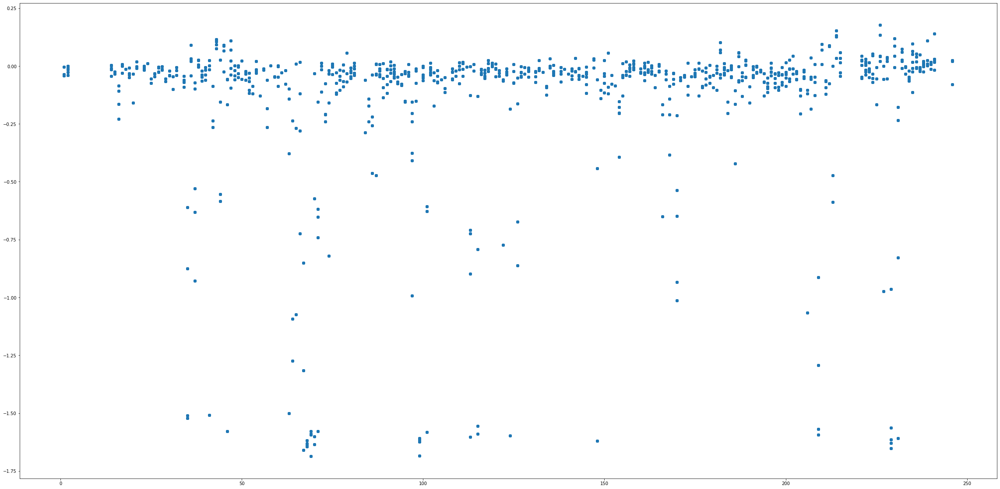

In [38]:
fig, ax = plt.subplots(figsize=(40,20))

bars1 = ax.scatter('position', 'median', data=dfNew_final)

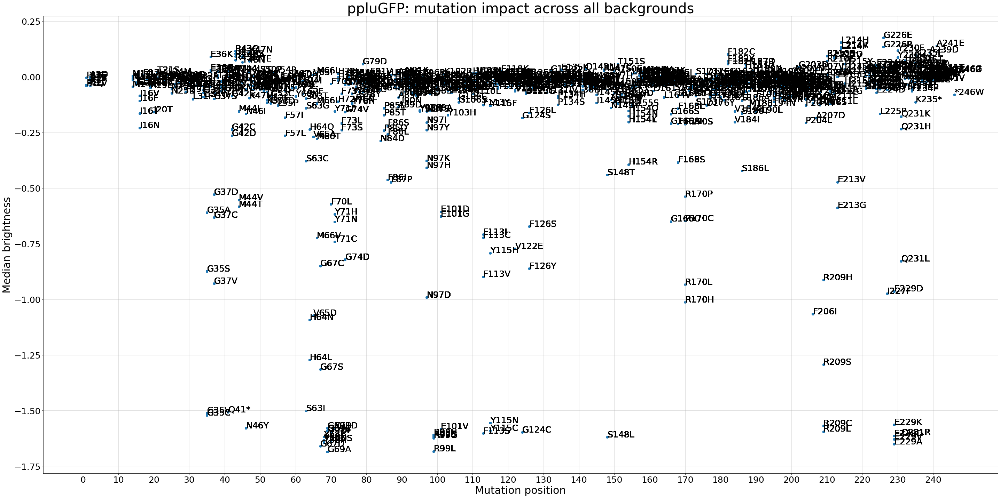

In [39]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_final)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_final[['position', 'median', 'mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Median brightness', fontsize=30)
ax.set_xlabel('Mutation position', fontsize=30)
ax.set_title('ppluGFP: mutation impact across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 250, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()

#plt.savefig('cgre_bright_annot.png', dpi=300)

In [57]:
#Take the columns we need

dfNew_finally=dfNew_final[['position', 'bright_context', 'median', 'mutation','bac_num']]
dfNew_threshold=dfNew_thres[['position', 'bright_context', 'median', 'mutation','bac_num']]

In [58]:
#Calculate the standard deviation of the impact
dfNew_finally['stdev']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['stdev'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.std()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_ob

,position,bright_context,median,mutation,bac_num,stdev
2877,226,0.196639,0.176612,G226E,44,0.103823
9063,226,0.147667,0.176612,G226E,44,0.103823
16303,226,0.153454,0.176612,G226E,44,0.103823
16014,226,0.126507,0.176612,G226E,44,0.103823
16872,226,0.110131,0.176612,G226E,44,0.103823
...,...,...,...,...,...,...
11801,69,-1.728961,-1.68578,G69A,8,0.254323
24453,69,-1.022872,-1.68578,G69A,8,0.254323
34775,69,-1.515406,-1.68578,G69A,8,0.254323
15679,69,-1.756907,-1.68578,G69A,8,0.254323


In [59]:
dfNew_threshold['stdev']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['stdev'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.std()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,position,bright_context,median,mutation,bac_num,stdev
2877,226,0.196639,0.176612,G226E,44,0.103823
9063,226,0.147667,0.176612,G226E,44,0.103823
16303,226,0.153454,0.176612,G226E,44,0.103823
16014,226,0.126507,0.176612,G226E,44,0.103823
16872,226,0.110131,0.176612,G226E,44,0.103823
...,...,...,...,...,...,...
6394,64,-1.136191,-0.75,H64N,46,0.30577
52865,64,-0.954172,-0.75,H64N,46,0.30577
75350,64,-1.372211,-0.75,H64N,46,0.30577
13723,64,-1.607682,-0.75,H64N,46,0.30577


In [60]:
%run "\Users\Elisenda\GFP_global_landscape\analysis\louisa\lgs01a_functions_for_getting_aa_pseudopositions.ipynb"

In [61]:
dfNew_finally['native_mutation']=""

for index, row in dfNew_finally.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('ppluGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_finally['native_mutation'][index] = yourstring
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
2877,226,0.196639,0.176612,G226E,44,0.103823,G206E
9063,226,0.147667,0.176612,G226E,44,0.103823,G206E
16303,226,0.153454,0.176612,G226E,44,0.103823,G206E
16014,226,0.126507,0.176612,G226E,44,0.103823,G206E
16872,226,0.110131,0.176612,G226E,44,0.103823,G206E
...,...,...,...,...,...,...,...
11801,69,-1.728961,-1.68578,G69A,8,0.254323,G58A
24453,69,-1.022872,-1.68578,G69A,8,0.254323,G58A
34775,69,-1.515406,-1.68578,G69A,8,0.254323,G58A
15679,69,-1.756907,-1.68578,G69A,8,0.254323,G58A


In [62]:
dfNew_threshold['native_mutation']=""

for index, row in dfNew_threshold.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('ppluGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_threshold['native_mutation'][index] = yourstring
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
2877,226,0.196639,0.176612,G226E,44,0.103823,G206E
9063,226,0.147667,0.176612,G226E,44,0.103823,G206E
16303,226,0.153454,0.176612,G226E,44,0.103823,G206E
16014,226,0.126507,0.176612,G226E,44,0.103823,G206E
16872,226,0.110131,0.176612,G226E,44,0.103823,G206E
...,...,...,...,...,...,...,...
6394,64,-1.136191,-0.75,H64N,46,0.30577,H53N
52865,64,-0.954172,-0.75,H64N,46,0.30577,H53N
75350,64,-1.372211,-0.75,H64N,46,0.30577,H53N
13723,64,-1.607682,-0.75,H64N,46,0.30577,H53N


In [63]:
#Create the dataset of the mutations we want to annotate, in this case the ones with a median impact larger than 0.1

dfNew_text_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_text_final=dfNew_text_final.drop_duplicates('mutation')
dfNew_text_final=dfNew_text_final.sort_values(by=['position'])

dfNew_text_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_text_thres=dfNew_text_thres.drop_duplicates('mutation')
dfNew_text_thres=dfNew_text_thres.sort_values(by=['position'])

In [64]:
dfNew_annot_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_annot_final = dfNew_annot_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_final=dfNew_annot_final.drop_duplicates('mutation')
dfNew_annot_final=dfNew_annot_final.sort_values(by=['position'])

dfNew_annot_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_annot_thres = dfNew_annot_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_thres=dfNew_annot_thres.drop_duplicates('mutation')
dfNew_annot_thres=dfNew_annot_thres.sort_values(by=['position'])

In [65]:
killing_mut = ['R86', 'Y57', 'G58', 'E209']

dfNew_annot_kill = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R86|Y57|G58|E209')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
34769,68,-1.61871,Y68F,Y57F
16766,68,-1.64422,Y68H,Y57H
23971,68,-1.63768,Y68C,Y57C
30216,68,-1.63161,Y68N,Y57N
1699,69,-1.68578,G69A,G58A
34726,69,-1.58973,G69C,G58C
14543,69,-1.57865,G69D,G58D
4476,69,-1.59385,G69S,G58S
6861,99,-1.60923,R99H,R86H
11706,99,-1.61608,R99S,R86S


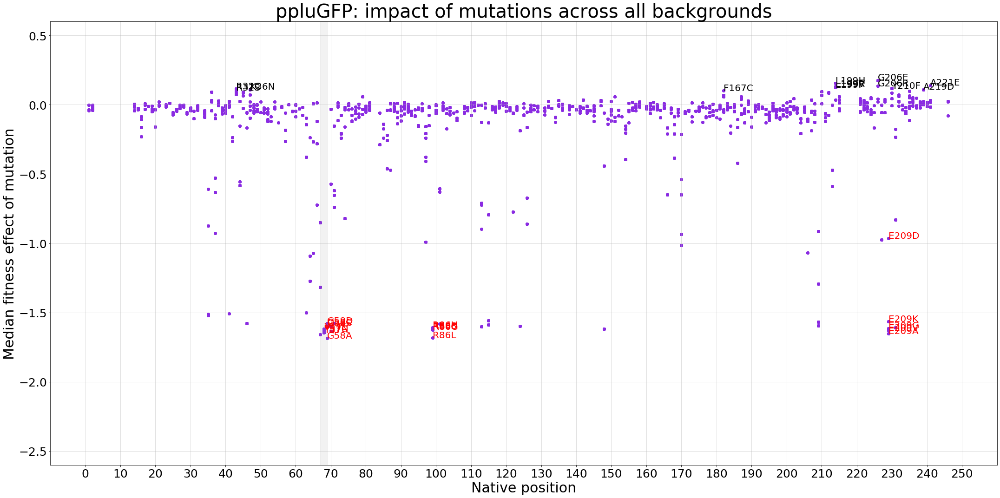

In [70]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'median', data=dfNew_finally, c='blueviolet', s=30)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_final[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-2.5, 1, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-2.6, ymax=0.6)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()

plt.savefig('pplu_median_impact_scat_final.png', dpi=300)

In [50]:
killing_mut = ['R86', 'Y57', 'G58', 'E209']

dfNew_annot_kill = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R86|Y57|G58|E209')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
17804,68,-0.75,Y68F,Y57F
11009,68,-0.75,Y68C,Y57C
17130,68,-0.75,Y68N,Y57N
19361,68,-0.75,Y68H,Y57H
34111,69,-0.75,G69D,G58D
18228,69,-0.75,G69S,G58S
34726,69,-0.75,G69C,G58C
15679,69,-0.75,G69A,G58A
14839,99,-0.75,R99C,R86C
19522,99,-0.75,R99G,R86G


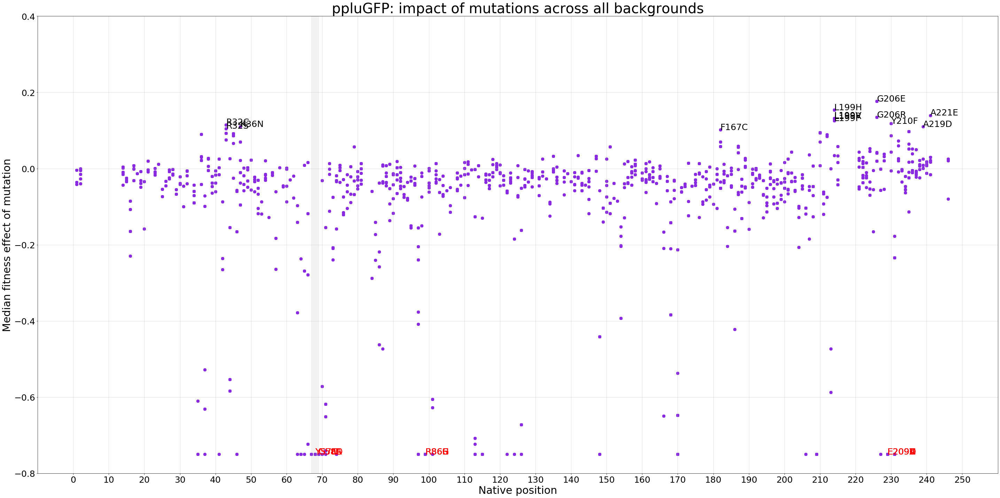

In [51]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_threshold, c='blueviolet', s=60)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_thres[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-0.8, 0.6, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-0.8, ymax=0.4)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()

plt.savefig('pplu_median_impact_scat_thres.png', dpi=300)

In [52]:
#Print the mutations we are selecting as more benficial

x = dfNew_annot_thres.mutation.to_string(header=False,
                  index=False).split('\n')
vals = '|'.join(x)
print(vals)

  R43C|  R43S|  K47N| F182C| L214H| L214V| L214R| L214F| G226E| G226R| Y230F| A239D| A241E


In [67]:
dfNew_annot_kill_final = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R86|Y57|G58|E209')]
dfNew_annot_kill_final = dfNew_annot_kill_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_final=dfNew_annot_kill_final.drop_duplicates('mutation')
dfNew_annot_kill_final=dfNew_annot_kill_final.sort_values(by=['position'])

dfNew_annot_kill_thres = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R86|Y57|G58|E209')]
dfNew_annot_kill_thres = dfNew_annot_kill_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_thres=dfNew_annot_kill_thres.drop_duplicates('mutation')
dfNew_annot_kill_thres=dfNew_annot_kill_thres.sort_values(by=['position'])

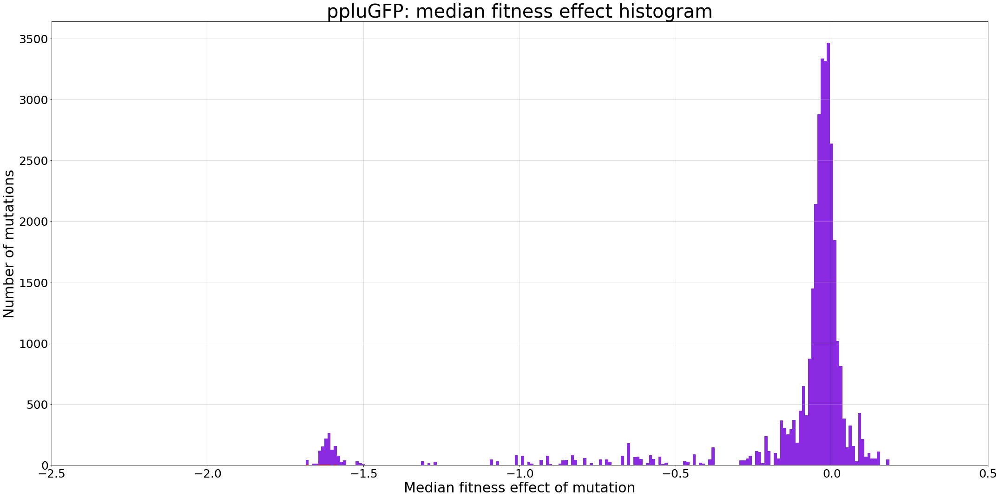

In [68]:
fig, ax = plt.subplots(figsize=(30,15))
data=dfNew_finally['median']
data1=dfNew_annot_kill_final['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01),color='blueviolet')
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('ppluGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-6.2, 1, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-6, xmax=1)
#ax.set_ylim(ymax=7000)

ax.set_xticks(np.arange(-2.5, 1, step=0.5));
ax.set_yticks(np.arange(0, 4000, step=500));

fig.tight_layout()
plt.savefig('pplu_median_impact_hist_final.png', dpi=300)

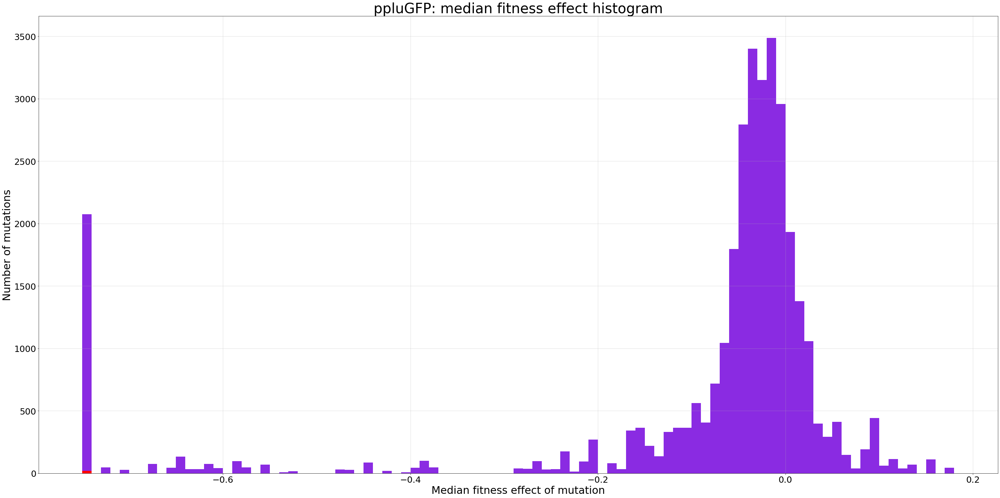

In [55]:
fig, ax = plt.subplots(figsize=(40,20))
data=dfNew_threshold['median']
data1=dfNew_annot_kill_thres['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01),color='blueviolet')
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('ppluGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-4.2, 0.9, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-4.1)
#ax.set_ylim(ymax=7000)

fig.tight_layout()
plt.savefig('pplu_median_impact_hist_thres.png', dpi=300)

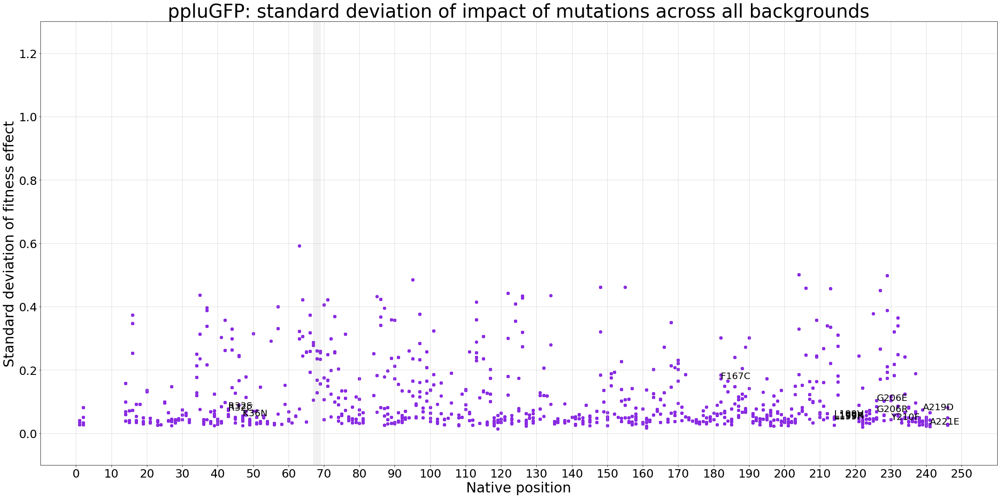

In [71]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'stdev', data=dfNew_finally, c='blueviolet', s=30)
dfNew_text_final[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(0, 1.4, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
ax.set_ylim(ymin=-0.1,ymax=1.3)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('pplu_stdev_scat_final.png', dpi=300)

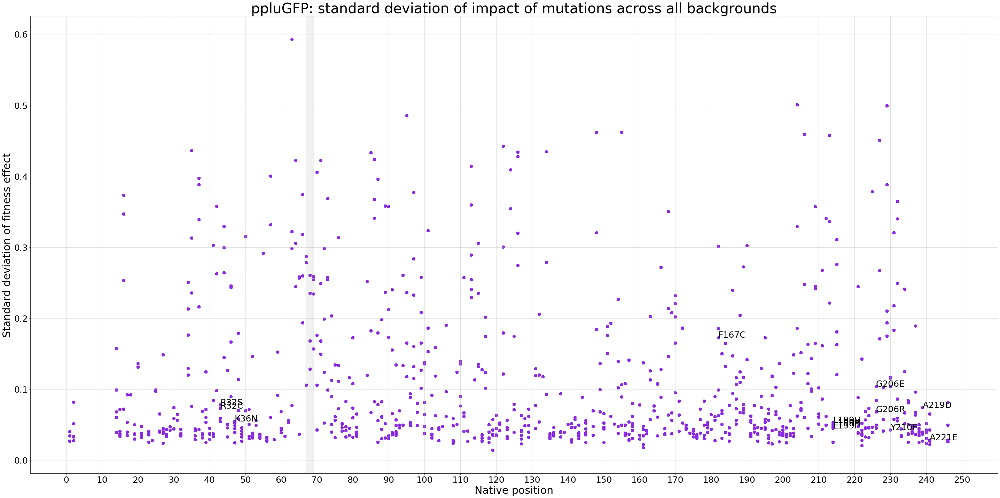

In [57]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'stdev', data=dfNew_threshold, c='blueviolet', s=60)
dfNew_text_thres[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
#ax.set_yticks(np.arange(-0.2, 2.8, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=2.6)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('pplu_stdev_scat_final.png', dpi=300)

In [58]:
dfNew_finally['ben_vs_del'] = dfNew_finally['bright_context']
dfNew_threshold['ben_vs_del'] = dfNew_threshold['bright_context']

In [59]:
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] > 0] = 1
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] < 0] = 0

dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] > 0] = 1
dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] < 0] = 0

In [60]:
dfNew_threshold['comparison']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['comparison'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].ben_vs_del.sum()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
2877,226,0.196639,0.176612,G226E,44,0.103823,G206E,1.0,43
16401,226,0.159092,0.176612,G226E,44,0.103823,G206E,1.0,43
16397,226,0.361294,0.176612,G226E,44,0.103823,G206E,1.0,43
16868,226,-0.251240,0.176612,G226E,44,0.103823,G206E,0.0,43
16088,226,0.085244,0.176612,G226E,44,0.103823,G206E,1.0,43
...,...,...,...,...,...,...,...,...,...
34775,69,-1.515406,-0.75,G69A,8,0.254323,G58A,0.0,0
15679,69,-1.756907,-0.75,G69A,8,0.254323,G58A,0.0,0
4520,99,-1.706365,-0.75,R99L,35,0.101415,R86L,0.0,0
14604,68,-1.785527,-0.75,Y68C,63,0.23526,Y57C,0.0,0


In [61]:
dfNew_finally['comparison']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['comparison'][index] = dfNew_finally[dfNew_finally['mutation']==pos].ben_vs_del.sum()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
2877,226,0.196639,0.176612,G226E,44,0.103823,G206E,1.0,43
16401,226,0.159092,0.176612,G226E,44,0.103823,G206E,1.0,43
16397,226,0.361294,0.176612,G226E,44,0.103823,G206E,1.0,43
16868,226,-0.251240,0.176612,G226E,44,0.103823,G206E,0.0,43
16088,226,0.085244,0.176612,G226E,44,0.103823,G206E,1.0,43
...,...,...,...,...,...,...,...,...,...
11801,69,-1.728961,-1.68578,G69A,8,0.254323,G58A,0.0,0
24453,69,-1.022872,-1.68578,G69A,8,0.254323,G58A,0.0,0
34775,69,-1.515406,-1.68578,G69A,8,0.254323,G58A,0.0,0
15679,69,-1.756907,-1.68578,G69A,8,0.254323,G58A,0.0,0


In [62]:
#dfNew_comp['ones']=1
#position=dfNew_comp['mutation']
#sum_pos = {}
#for pos in position:
    #posit = dfNew_comp[dfNew_comp['mutation']== pos]
    #sum_pos[pos] = posit['ones'].sum()
    
#sum_pos = pd.DataFrame.from_dict(sum_pos, orient='index')
#sum_pos.columns =['total']
#sum_pos = sum_pos.rename_axis('mutation').reset_index()
#dfNew_total= pd.merge(dfNew_comp, sum_pos, on='mutation')
#dfNew_comp =dfNew_comp.dropna()
dfNew_finally['percentage']=dfNew_finally['comparison']/dfNew_finally['bac_num']
dfNew_threshold['percentage']=dfNew_threshold['comparison']/dfNew_threshold['bac_num']

In [63]:
dfNew_finally = dfNew_finally.rename(columns={'percentage': 'ben_percentage'})
dfNew_finally['del_percentage']=1-dfNew_finally['ben_percentage']

dfNew_threshold = dfNew_threshold.rename(columns={'percentage': 'ben_percentage'})
dfNew_threshold['del_percentage']=1-dfNew_threshold['ben_percentage']

In [64]:
dfNew_finally=dfNew_finally.sort_values(by=['ben_percentage'])
dfNew_threshold=dfNew_threshold.sort_values(by=['ben_percentage'])

In [65]:
dfNew_tag_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_tag_final=dfNew_tag_final.drop_duplicates('mutation')
dfNew_tag_final=dfNew_tag_final.sort_values(by=['position'])

dfNew_tag_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_tag_thres=dfNew_tag_thres.drop_duplicates('mutation')
dfNew_tag_thres=dfNew_tag_thres.sort_values(by=['position'])

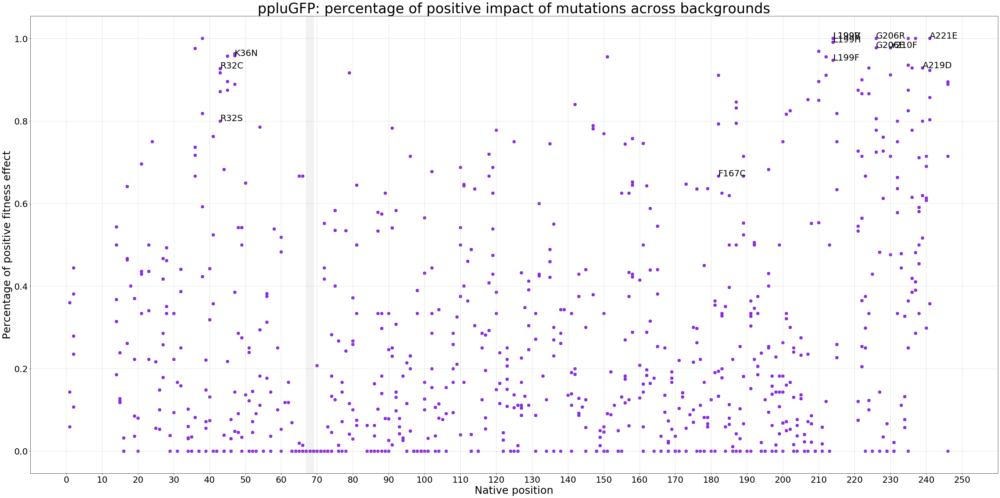

In [66]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_finally, c='blueviolet', s=60)
dfNew_tag_final[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('pplu_percentage_scat_final.png', dpi=300)

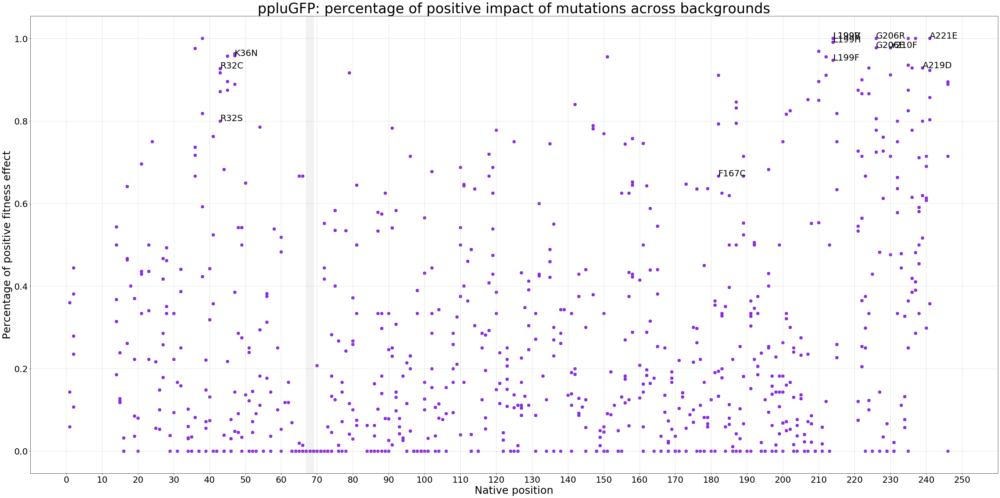

In [67]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_threshold, c='blueviolet', s=60)
dfNew_tag_thres[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('ppluGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('pplu_percentage_scat_thres.png', dpi=300)

In [68]:
dfNew_finally=dfNew_finally.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})

In [69]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
dtype: object

In [70]:
to_plot_final=dfNew_finally.groupby('mutation').ben_percentage.agg(np.mean).sort_values()
to_plot_thres=dfNew_threshold.groupby('mutation').ben_percentage.agg(np.mean).sort_values()

In [71]:
dfNew_finally.to_csv('pplu_percentage_final.csv')
dfNew_threshold.to_csv('pplu_percentage_thres.csv')

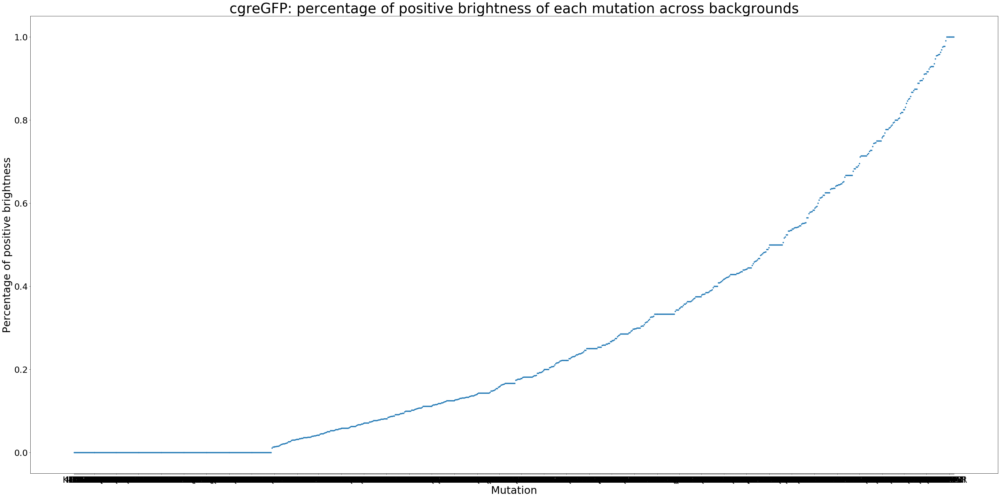

In [72]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_final, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('cgreGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('pplu_bright_percentage_pseudo.png', dpi=300)

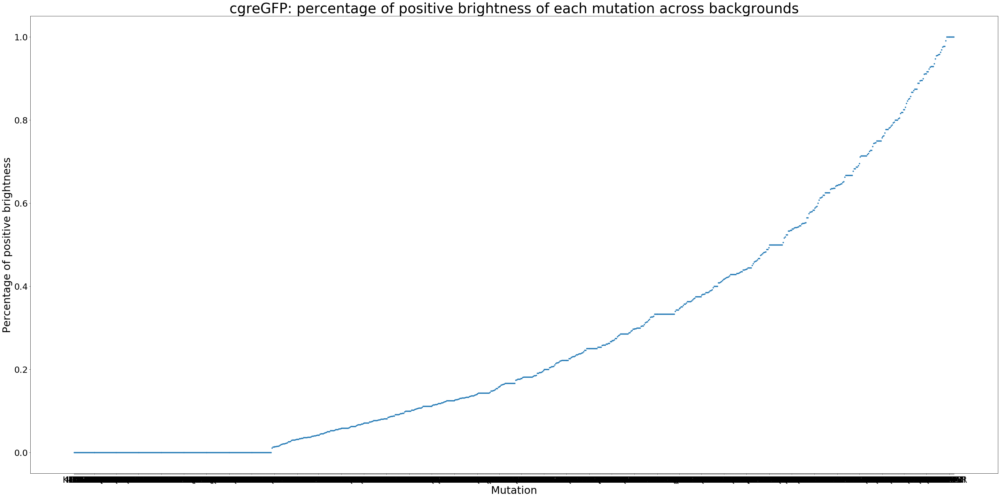

In [73]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_thres, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('cgreGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('pplu_bright_percentage_pseudo.png', dpi=300)

In [74]:
to_plot_final=dfNew_finally.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_final

,median,stdev,variance,index_disp
mutation,,,,
*246C,0.020995,0.081123,0.006581,0.000534
*246G,0.024729,0.028642,0.000820,0.000023
*246R,0.021902,0.025904,0.000671,0.000017
*246W,-0.079937,0.049279,0.002428,0.000120
A119E,0.013059,0.036889,0.001361,0.000050
...,...,...,...,...
Y80S,-0.053104,0.032317,0.001044,0.000034
Y95C,-0.150422,0.236158,0.055770,0.013171
Y95F,-0.032387,0.117620,0.013835,0.001627


In [75]:
to_plot_thres=dfNew_threshold.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']
to_plot_thres

,median,stdev,variance,index_disp
mutation,,,,
*246C,0.020995,0.081123,0.006581,0.000534
*246G,0.024729,0.028642,0.000820,0.000023
*246R,0.021902,0.025904,0.000671,0.000017
*246W,-0.079937,0.049279,0.002428,0.000120
A119E,0.013059,0.036889,0.001361,0.000050
...,...,...,...,...
Y80S,-0.053104,0.032317,0.001044,0.000034
Y95C,-0.150422,0.236158,0.055770,0.013171
Y95F,-0.032387,0.117620,0.013835,0.001627


In [76]:
to_plot_final.to_csv('pplu_median_final.csv')
to_plot_thres.to_csv('pplu_median_thres.csv')

In [77]:
to_annotate_final = to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres = to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

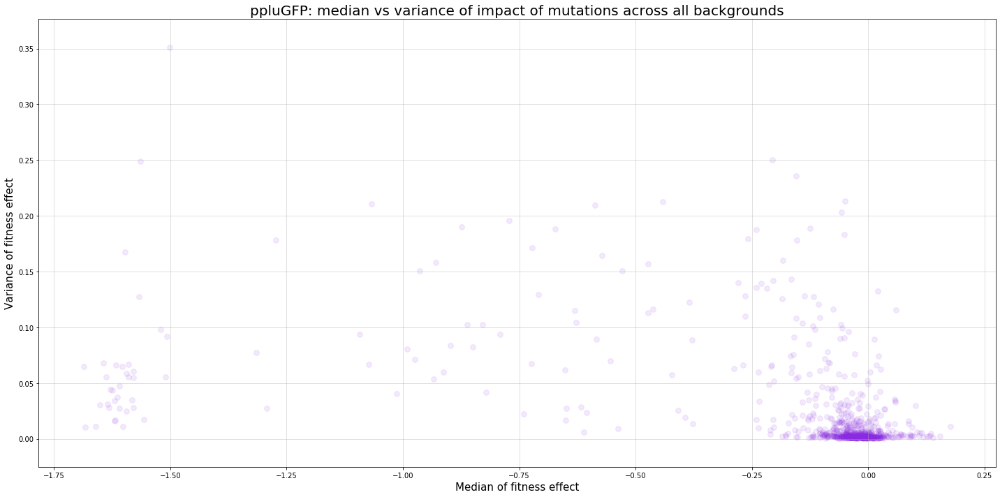

In [78]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_final, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('ppluGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1, step=0.5));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6,xmax=1)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('pplu_median_var_final.png', dpi=300)

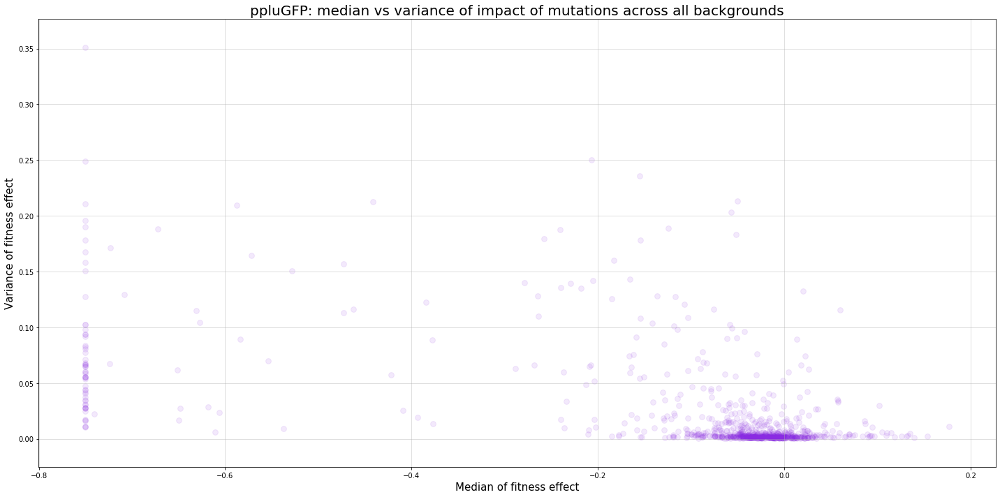

In [79]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_thres, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('ppluGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('pplu_median_var_thres.png', dpi=300)

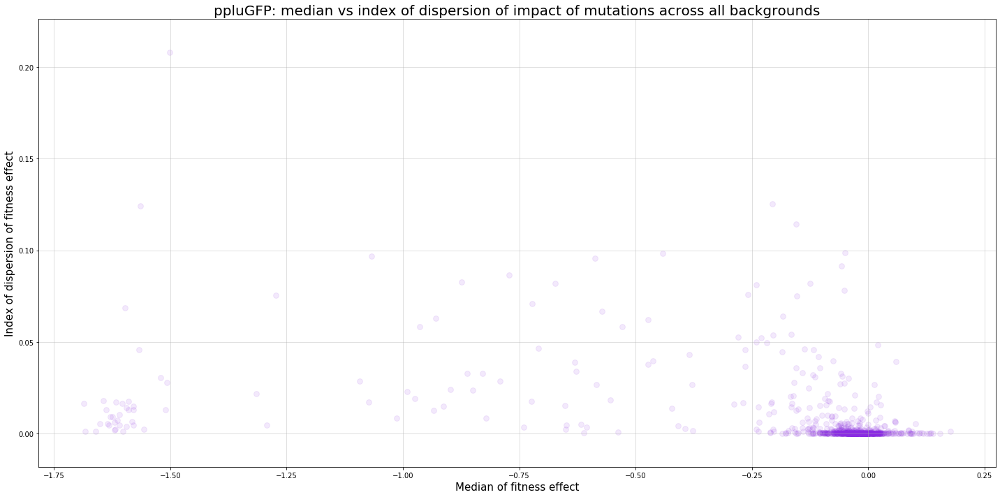

In [80]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_final, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('ppluGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('pplu_median_ind_pseudo.png', dpi=300)

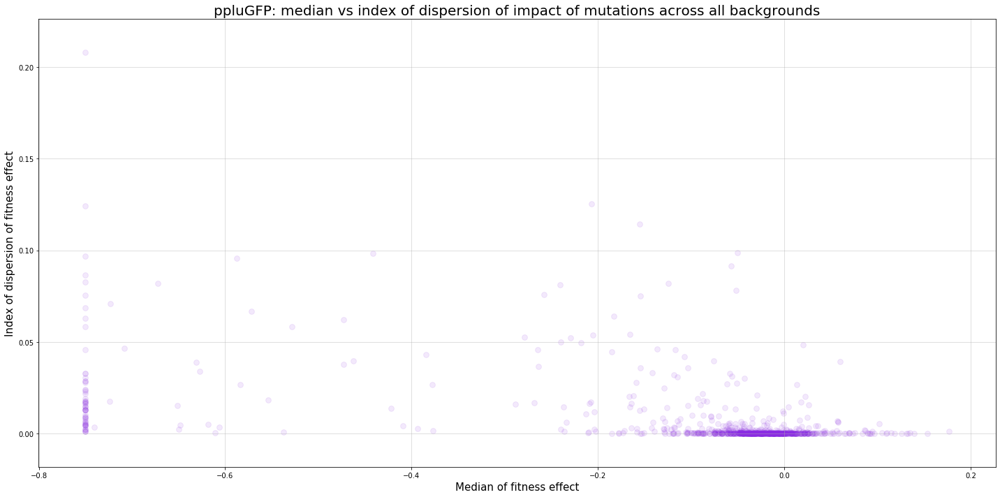

In [81]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_thres, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('ppluGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('pplu_median_ind_pseudo.png', dpi=300)

In [82]:
dfNew_finally['mean']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['mean'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.mean()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
16616,226,0.193859,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
1901,226,0.173249,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
16708,226,0.250243,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
16872,226,0.110131,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
8197,226,0.237391,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
...,...,...,...,...,...,...,...,...,...,...,...,...
11801,69,-1.728961,-1.685785,G69A,8,0.254323,G58A,0.0,0.0,0.000000,1.000000,-1.5863
24453,69,-1.022872,-1.685785,G69A,8,0.254323,G58A,0.0,0.0,0.000000,1.000000,-1.5863
34775,69,-1.515406,-1.685785,G69A,8,0.254323,G58A,0.0,0.0,0.000000,1.000000,-1.5863
15679,69,-1.756907,-1.685785,G69A,8,0.254323,G58A,0.0,0.0,0.000000,1.000000,-1.5863


In [83]:
dfNew_threshold['mean']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['mean'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.mean()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
16616,226,0.193859,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
1901,226,0.173249,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
16708,226,0.250243,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
16872,226,0.110131,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
8197,226,0.237391,0.176612,G226E,44,0.103823,G206E,1.0,43.0,0.977273,0.022727,0.174465
...,...,...,...,...,...,...,...,...,...,...,...,...
15180,70,-1.533582,-0.750000,F70I,22,0.105927,F59I,0.0,0.0,0.000000,1.000000,-1.60565
9400,124,-1.656759,-0.750000,G124C,21,0.409107,G111C,0.0,0.0,0.000000,1.000000,-1.43251
7047,124,-1.483513,-0.750000,G124C,21,0.409107,G111C,0.0,0.0,0.000000,1.000000,-1.43251
32656,69,-1.325006,-0.750000,G69S,53,0.156601,G58S,0.0,0.0,0.000000,1.000000,-1.5855


In [84]:
dfNew_finally=dfNew_finally.astype({'mean': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'mean': 'float64'})

In [85]:
to_plot_final=dfNew_finally.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']

to_plot_thres=dfNew_threshold.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']

In [86]:
to_plot_final.to_csv('pplu_mean_final.csv')
to_plot_thres.to_csv('pplu_mean_thres.csv')

In [87]:
to_annotate_final=to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres=to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

In [88]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
mean               float64
dtype: object

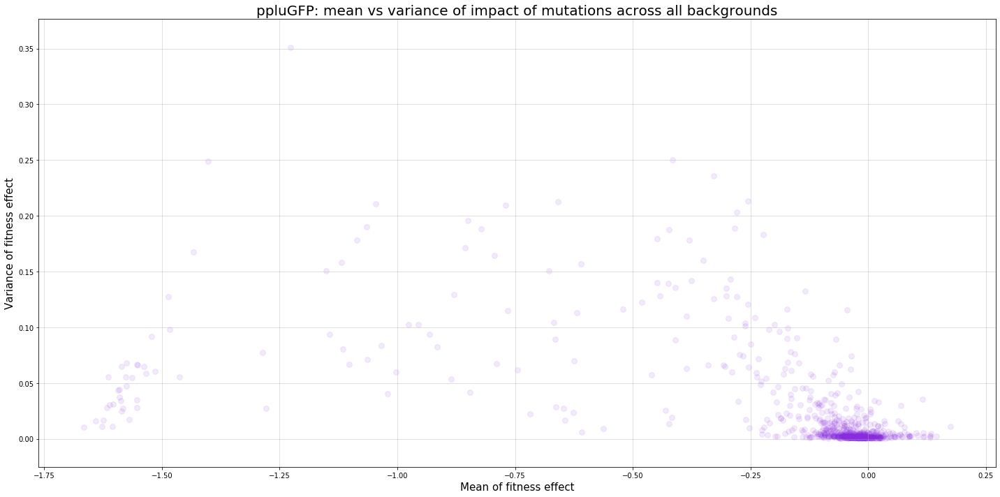

In [89]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_final, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('ppluGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('pplu_mean_var_pseudo.png', dpi=300)

In [90]:
### fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_thres, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('ppluGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('pplu_mean_var_pseudo.png', dpi=300)

In [91]:
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']

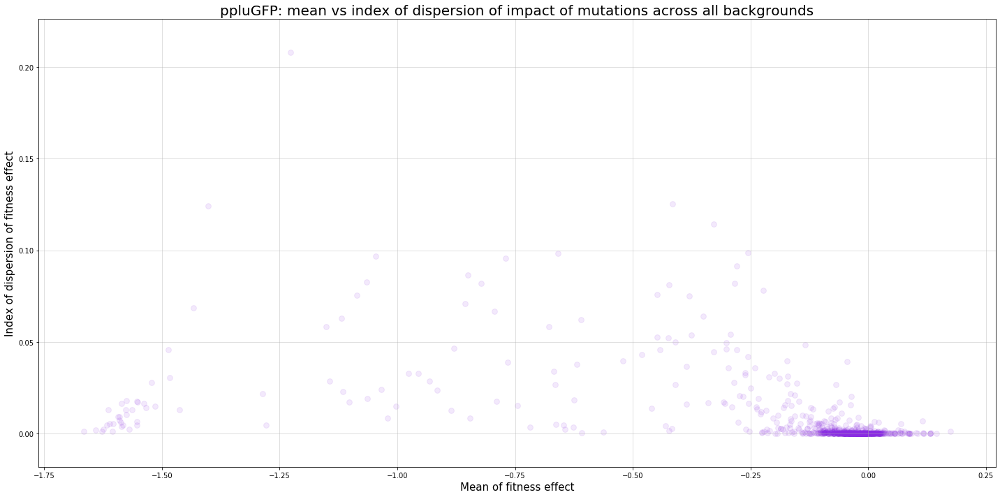

In [92]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_final, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('ppluGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('pplu_mean_ind_pseudo.png', dpi=300)

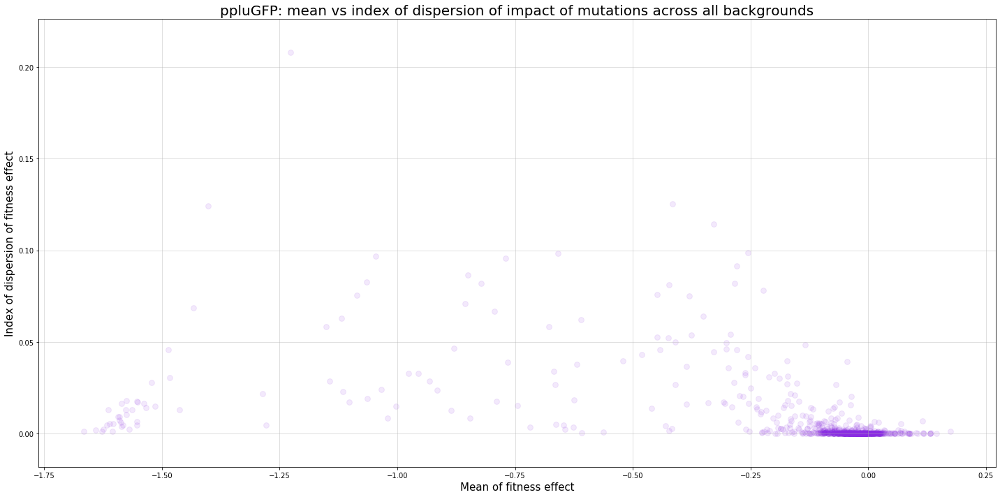

In [93]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_thres, c='blueviolet', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('ppluGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('pplu_mean_ind_pseudo.png', dpi=300)

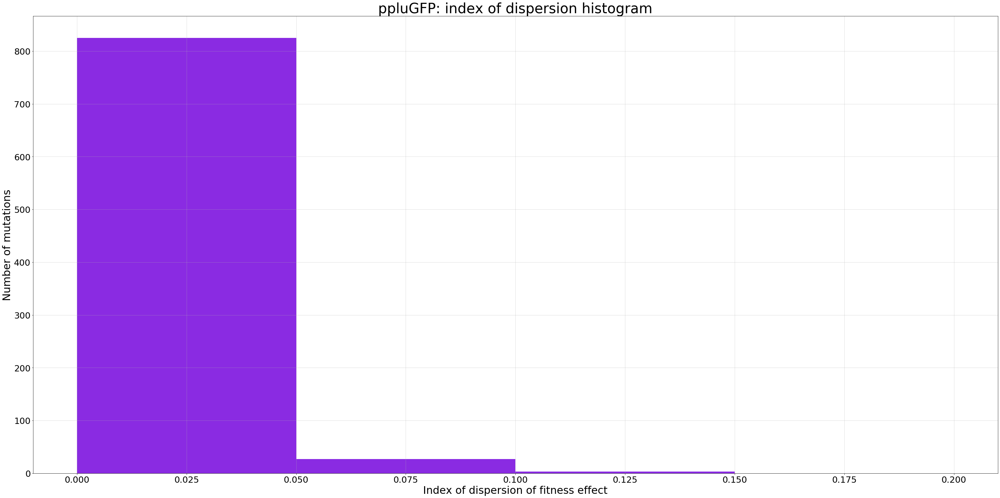

In [94]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_final['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='blueviolet')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('ppluGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('pplu_ind_hist_pseudo.png', dpi=300)

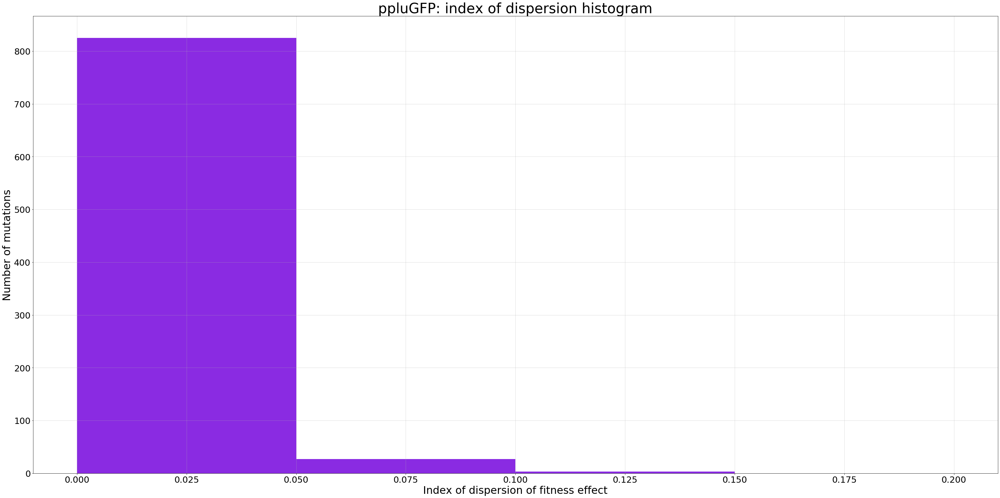

In [95]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_thres['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='blueviolet')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('ppluGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('pplu_ind_hist_pseudo.png', dpi=300)

In [96]:
to_plot_final.to_csv('pplu_values_final.csv')
to_plot_thres.to_csv('pplu_values_thres.csv')